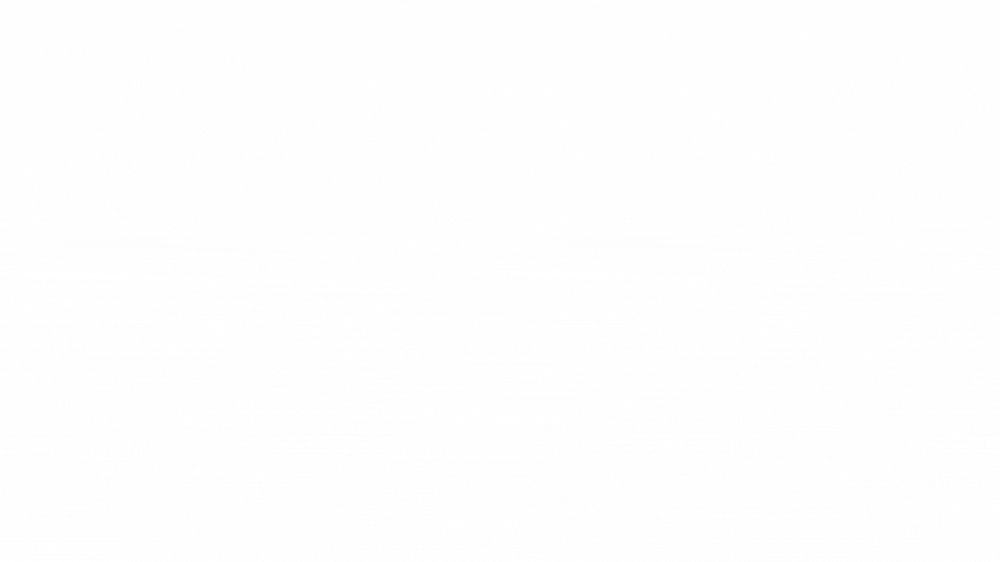

<div style="background-color:#F2ECC6; padding:20px; font-size:15px">
    
**What is Customer Segmentation?**
    
Customer segmentation is the practice of categorizing customers into distinct groups based on shared characteristics, enabling companies to target and tailor their marketing strategies to each group effectively. Customers are typically segmented based on their similarities in behavior, preferences, and purchasing habits.

<a class="anchor" id="About_Data"></a>
# <p style="padding:15px;background-color:#798517;margin:0;color:#F2ECC6;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">About Data</p> 

<div style="background-color:#F2ECC6; padding:20px; font-size:15px">
    
**☀️Introduction:** 

The main task of **Clustering** is to identify natural groups within an unlabeled dataset. This means that clustering is an **Unsupervised Machine Learning** task, which is important in many scientific, engineering, and business domains. Some well-known applications of clustering include:

- Customer segmentation for efficient marketing
- Image segmentation for computer vision
- Document clustering for information retrieval
    
**☀️Objective:**  
    
This project demonstrates how to perform customer segmentation for a shopping mall using machine learning algorithms. This is an unsupervised clustering problem, and we will present and compare five popular clustering algorithms: **K-Means Clustering, Hierarchical Clustering, Gaussian Mixture Clustering, Mini-batch K-Means Clustering**, and **DBSCAN Clustering**. The main goal of this notebook is to cover the basics of clustering methods while also touching on some more advanced aspects.
    
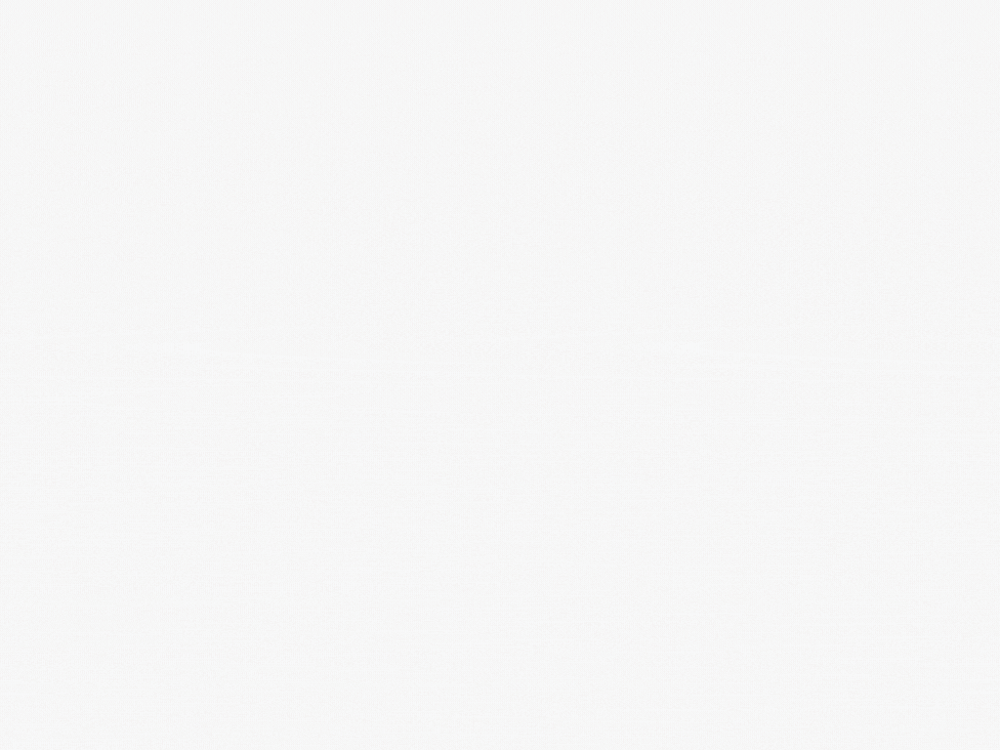

<div style="background-color:#F2ECC6; padding:20px; font-size:15px">
    
|       | **Attribute** | **Information** |
| :---  |     :---      |       :---      |      
| **1** | **CUST_ID** | Credit card holder ID |                
| **2** | **BALANCE** | Monthly average balance (based on daily balance averages) |                        
| **3** | **BALANCE_FREQUENCY** | Ratio of last 12 months with balance. (1: Frequently updated, 0: Not frequently updated) |
| **4** | **PURCHASES** | Total purchase amount spent during last 12 months |
| **5** | **ONEOFF_PURCHASES** | Total amount of one-off purchases |                     
| **6** | **INSTALLMENTS_PURCHASES** | Total amount of installment purchases |
| **7** | **CASH_ADVANCE** | Total cash-advance amount |  
| **8** | **PURCHASES_FREQUENCY** | Frequency of purchases (Percent of months with at least one purchase). (1: Frequently purchased, 0: Not frequently purchased) |                      
| **9** | **ONEOFF_PURCHASES_FREQUENCY** | Frequency of one-off-purchases. (1: Frequently purchased, 0: Not frequently purchased) |
| **10** | **PURCHASES_INSTALLMENTS_FREQUENCY** | Frequency of installment purchases. (1: Frequently purchased, 0: Not frequently purchased) |
| **11** | **CASHADVANCE_FREQUENCY** | Cash-Advance frequency |                      
| **12** | **CASH_ADVANCE_TRX** | Average amount per cash-advance transaction |              
| **13** | **PURCHASES_TRX** | Average amount per purchase transaction |                      
| **14** | **CREDIT_LIMIT** | Credit limit |
| **15** | **PAYMENTS** | Total payments (Due amount paid by the customer to decrease their statement balance) in the period |
| **16** | **MINIMUM_PAYMENTS** | Total minimum payments due in the period |                      
| **17** | **PRC_FULL_PAYMEN** | Percentage of months with full payment of the due statement balance | 
| **18** | **TENURE** | Number of months as a customer |              

<a id="1"></a> 
# <p style="padding:15px;background-color:#798517;margin:0;color:#F2ECC6;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">1. Import Libraries</p> 

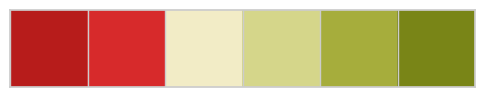

In [2]:
# Data
import pandas as pd
import numpy as np
from scipy import stats

# Collections library for counting elements in a list
from collections import Counter

# tqdm library for progress bars
from tqdm import tqdm

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
from termcolor import colored

# Clustering Algorithms
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import DBSCAN
from itertools import product
#----------------------------------------------------
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
import xgboost as xg

# scipy library for hierarchical clustering
from scipy.cluster.hierarchy import ward, dendrogram, linkage
from scipy.cluster import hierarchy

# kneed library for finding the knee/elbow point in a plot
from kneed import KneeLocator, DataGenerator

# yellowbrick library for visualizing elbow and silhouette plots for clustering
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# sklearn library
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Scaling
from sklearn.preprocessing import StandardScaler

# ignoring the warnings while executing codes
import warnings
warnings.filterwarnings('ignore')

# Color pallet and theme
import matplotlib.colors
   
colors = ["#B71C1B","#D72A2B","#F2ECC6","#D5D68A","#A6AD3C","#798517"]
colors1 = ["#B71C1B","#D72A2B","#D5D68A","#A6AD3C","#798517"]
colors2 = ["#F2ECC6","#D5D68A","#A6AD3C","#798517","#D72A2B"]
cmap = matplotlib.colors.ListedColormap(colors2)

sns.palplot(sns.color_palette(colors))

<a id="1"></a> 
# <p style="padding:15px;background-color:#798517;margin:0;color:#F2ECC6;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">2. Reading and Understanding the Dataset</p> 

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">2.1. Import Dataset</p>

In [3]:
Data = pd.read_csv('E:/Customer_Data.csv')

In [4]:
# Preview the dataset
df = pd.DataFrame(Data)
df.head(5)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">2.2. Discover Data</p>

In [5]:
# View dimensions of dataset   
rows, col = df.shape
print ("Dimensions of dataset: {}" . format (df.shape))
print ('Rows:', rows, '\nColumns:', col)

Dimensions of dataset: (8950, 18)
Rows: 8950 
Columns: 18


In [6]:
# Statistical details
df.iloc[:, :-1].describe().T.sort_values(by='std', ascending = False)\
                          .style.background_gradient(cmap=cmap)\
                          .bar(subset=["max"], color=colors[1])\
                          .bar(subset=["mean"], color=colors[3])

,count,mean,std,min,25%,50%,75%,max
CREDIT_LIMIT,8949.000000,4494.449450,3638.815725,50.000000,1600.000000,3000.000000,6500.000000,30000.000000
PAYMENTS,8950.000000,1733.143852,2895.063757,0.000000,383.276166,856.901546,1901.134317,50721.483360
MINIMUM_PAYMENTS,8637.000000,864.206542,2372.446607,0.019163,169.123707,312.343947,825.485459,76406.207520
PURCHASES,8950.000000,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.570000
CASH_ADVANCE,8950.000000,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.211760
BALANCE,8950.000000,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.138560
ONEOFF_PURCHASES,8950.000000,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.250000
INSTALLMENTS_PURCHASES,8950.000000,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.000000
PURCHASES_TRX,8950.000000,14.709832,24.857649,0.000000,1.000000,7.000000,17.000000,358.000000
CASH_ADVANCE_TRX,8950.000000,3.248827,6.824647,0.000000,0.000000,0.000000,4.000000,123.000000


<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">
    <strong>🪐The table above shows:</strong> 
    <br>
    
- There are **8950** data recorded for all features except for **CREDIT_LIMIT** and **MINIMUM_PAYMENTS**.   

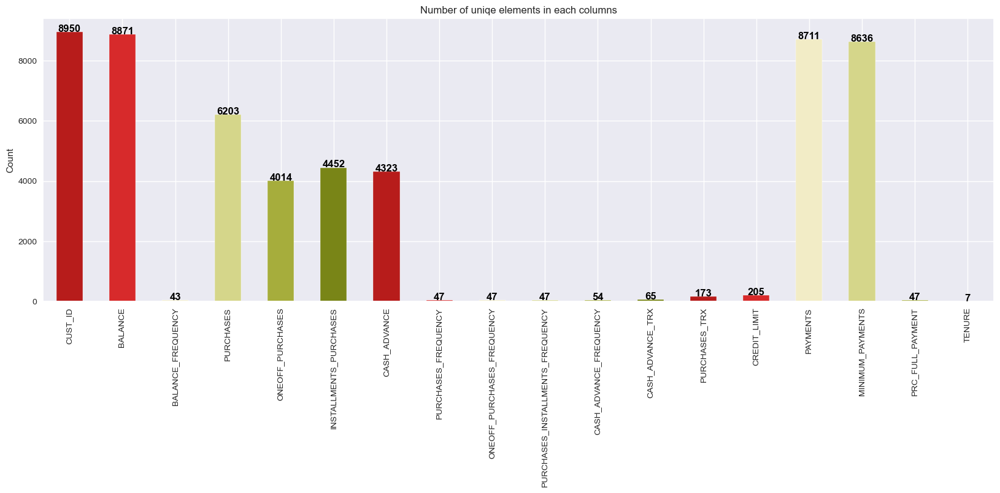

In [7]:
# Plot the unique values
unique = df.nunique()
sns.set_style('darkgrid')
plt.figure(figsize=(20, 6))
unique.plot(kind='bar', color=colors)
plt.title('Number of uniqe elements in each columns')
plt.ylabel('Count')
for i, v in enumerate(unique.values):
    plt.text(i, v+1, str(v), color='black', fontweight='bold', ha='center')
plt.show()

In [8]:
# Dtype
print(f'The data type contains:\n object --> {df.dtypes.value_counts()[2]}\n int64 --> {df.dtypes.value_counts()[1]}\n float64 --> {df.dtypes.value_counts()[0]}')

The data type contains:
 object --> 1
 int64 --> 3
 float64 --> 14


In [9]:
# Information about the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">
    <strong>🪐The information of data:</strong> 
    <br>
    
- The **Cust_Id** data type is classified as an **object**, while **Cash_Advance_Trx**, **Purchases_Trx**, and **Tenure** data types are categorized as **int64**. The remaining data types are represented as **float64**.

<a id="1"></a> 
# <p style="padding:15px;background-color:#798517;margin:0;color:#F2ECC6;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">3. Data Cleaning</p> 

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">3.1. Missing Values</p>

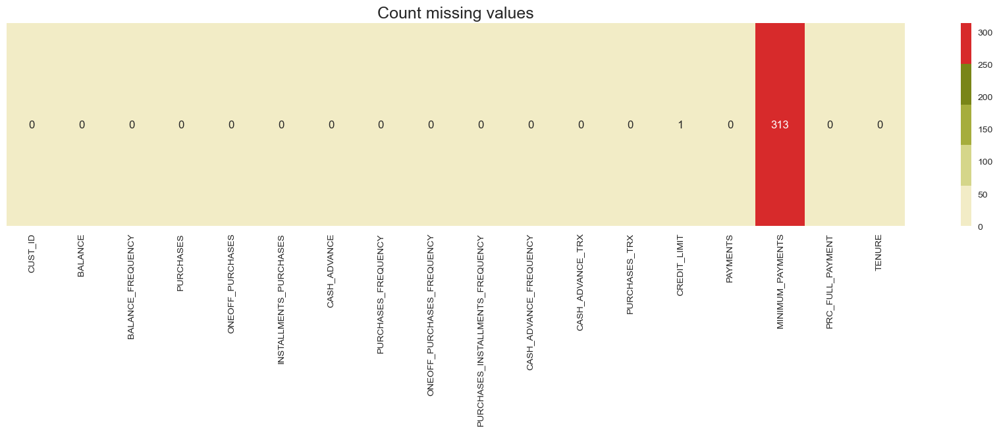

In [10]:
# Missing values
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap=cmap, annot=True,
             fmt='0.0f').set_title('Count missing values', fontsize=18)
plt.show()

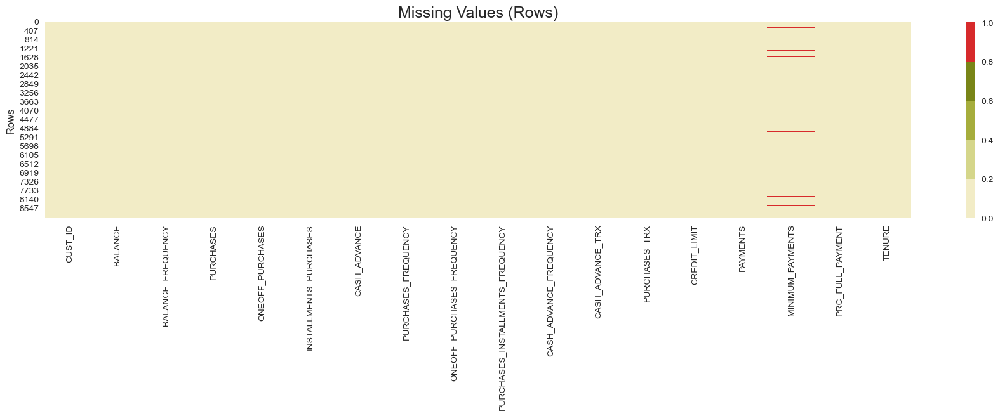

In [11]:
# Missing values with 'Rows'
plt.figure(figsize=(22,4))
sns.heatmap(df.isnull(), cmap=cmap)
plt.title('Missing Values (Rows)', fontsize=18)
plt.ylabel('Rows', fontsize=12)
plt.show()

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">🔴3.1.1. Dealing with Missing Values</p>

#### 🏝️CREDIT_LIMIT

In [12]:
# Check the Null value for 'Credit Limit'
null_cl = df[df['CREDIT_LIMIT'].isnull()]
null_cl.style.set_properties(**{'background-color': '#F2ECC6'}, subset=['CREDIT_LIMIT'])

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,C15349,18.400472,0.166667,0.000000,0.000000,0.000000,186.853063,0.000000,0.000000,0.000000,0.166667,1,0,nan,9.040017,14.418723,0.000000,6


In [13]:
# Drop the missing value for 'Credit Limit'
df = df.drop(5203)

# Reset index 
df = df.reset_index(drop=True)

# Dimensions of dataset 
print(df.shape)

(8949, 18)


#### 🏝️MINIMUM_PAYMENTS

In [14]:
# Check the Null value for 'MINIMUM_PAYMENTS'
df[['MINIMUM_PAYMENTS']][df['MINIMUM_PAYMENTS'].isna()]

,MINIMUM_PAYMENTS
3,NaN
45,NaN
47,NaN
54,NaN
55,NaN
...,...
8918,NaN
8928,NaN
8934,NaN
8943,NaN


<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

✍️Let's calculating **Pearson's correlation coefficient** between the **MINIMUM_PAYMENTS** feature and all other features in the dataframe.

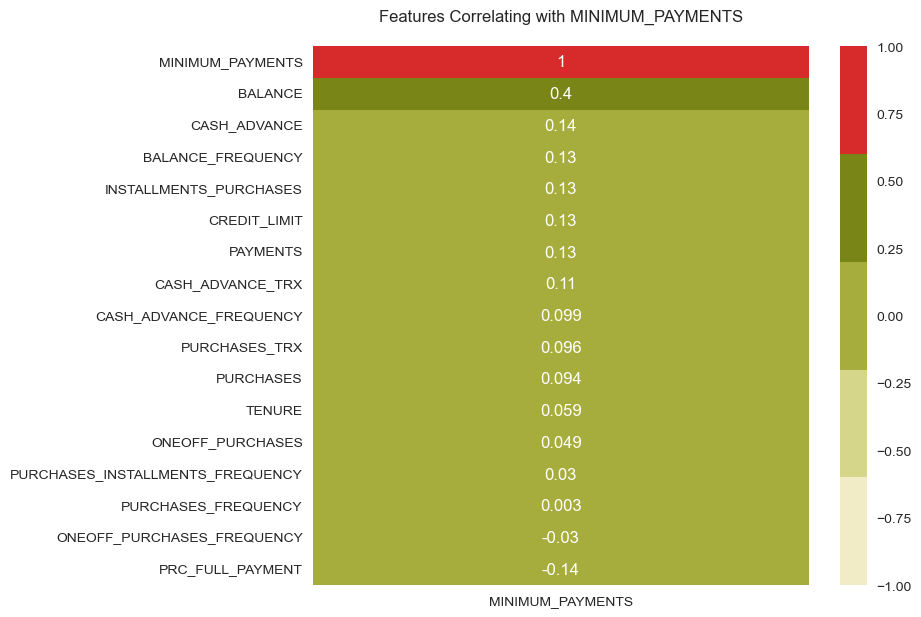

In [15]:
plt.figure (figsize = (8, 7), dpi = 100)
heatmap = sns.heatmap (df.corr()[['MINIMUM_PAYMENTS']].sort_values (by = 'MINIMUM_PAYMENTS', ascending = False),
                       vmin = -1, vmax = 1, annot = True, cmap = cmap)
heatmap.set_title ('Features Correlating with MINIMUM_PAYMENTS', fontdict = {'fontsize':12}, pad = 18);

<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">

**🪐Explanations:**
    
- In general, a correlation coefficient (r value) between **0.3** and **0.7** is considered a **moderate correlation**, while a coefficient **greater than 0.7** is considered a **strong correlation**.
    🔍[Reference: Ostle, Bernard (1996)](https://www.amazon.com/Engineering-Statistics-Industrial-Bernard-Ostle/dp/0534265383)
       
<blockquote>
    
- However, it is important to note that correlation does not imply causation, and other factors such as **sample size**, **data quality**, and the **nature of the data** can also impact the significance of the correlation.
    
---
- Here, we can't see a strong correlation between the **MINIMUM_PAYMENTS** feature and all other features in the dataframe.

✅**Therefore**, we can't get help from any feature to fill the **Nan values** of the **MINIMUM_PAYMENTS** feature.

<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

**✍️Some of the various data imputation techniques are:**

- Next or Previous Value.
- K Nearest Neighbors.
- Maximum or Minimum Value.
- Missing Value Prediction.
- Most Frequent Value.
- Average or Linear Interpolation.
- (Rounded) Mean or Moving Average or Median Value.
- Fixed Value.
    
**On the other hand**, the simplest imputation method is replacing missing values with the mean or median values of the dataset at large, or some similar summary statistic. This has the advantage of being the simplest possible approach, and one that doesn't introduce any undue bias into the dataset.
    
**✅Hence**, Using the **median** gives a better estimation of the central tendency of this feature (MINIMUM_PAYMENTS) compared to the mean, which could be influenced by outliers.

In [16]:
# Fill missing values in the 'MINIMUM_PAYMENTS' column with the median value
df['MINIMUM_PAYMENTS'].fillna(df['MINIMUM_PAYMENTS'].median(), inplace=True)

# Print the shape of the DataFrame
print(df.shape)

(8949, 18)


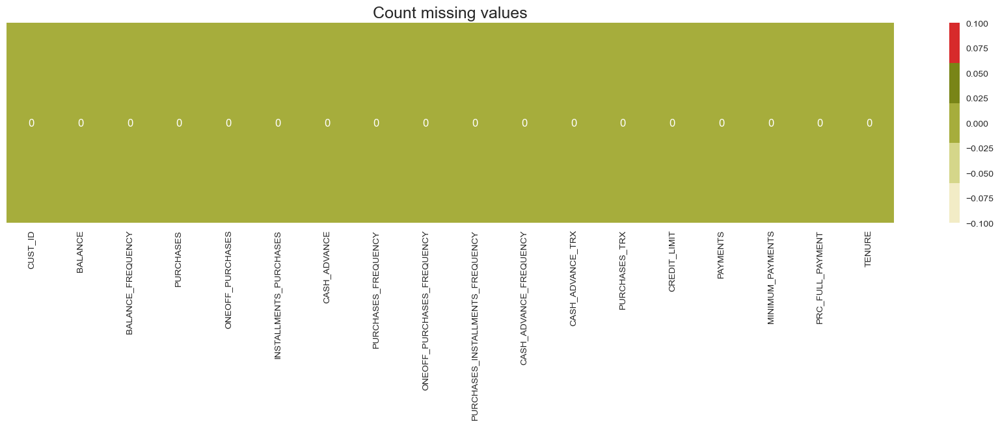

In [17]:
# Check the Missing values again
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap=cmap, annot=True,
             fmt='0.0f').set_title('Count missing values', fontsize=18)
plt.show()

Awesome!👍

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">3.2. Duplicated Data</p>

<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

**✍️Duplicate data** refers to the presence of identical records in a dataset, which can distort the analysis and lead to incorrect conclusions. Removing duplicates is crucial for accurate analysis and modeling.

In [18]:
# Duplicated data
df.duplicated().sum()

0

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">3.3. Redundant Columns</p>

<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

✍️To ensure our dataset only contains columns that have predictive power, we should remove any **redundant columns**. In this case, the column **CUST_ID** is redundant and will be dropped first.

In [19]:
# Drop CUST_ID column
df.drop(['CUST_ID'], axis=1, inplace=True)

# Print the shape of the DataFrame
print(df.shape)

(8949, 17)


<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">3.4. Outliers</p>

<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

✍️Investigating **Outliers** is an essential step in data analysis because they can significantly affect the statistical measures used to describe a dataset. Outliers are observations that differ significantly from other observations in the same dataset and can result from measurement errors, sampling issues, or genuine differences in the population. Identifying and dealing with outliers can help to improve the accuracy and reliability of statistical models and results, leading to more informed decisions and better outcomes. Therefore, outlier investigation is a crucial step in any data analysis process.

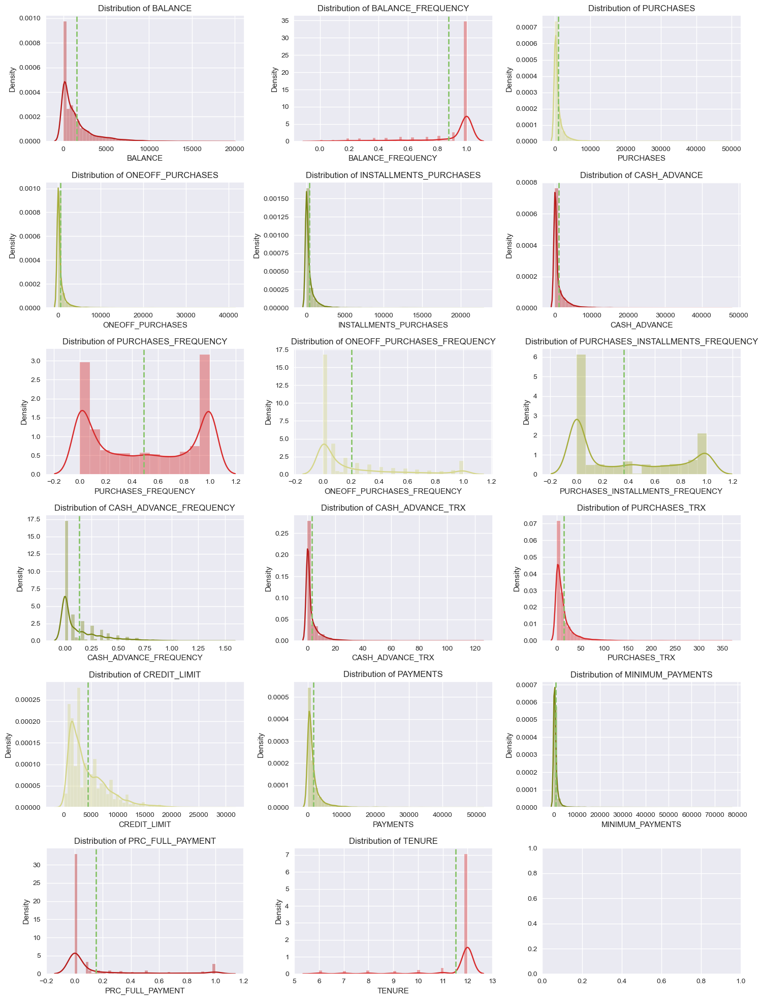

In [20]:
# Create subplots for all features
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 20))
sns.set_style('darkgrid')

for i, column in enumerate(df.columns):
    sns.distplot(df[column], color=colors1[i%5], ax=axes[i//3, i%3])
    axes[i//3, i%3].axvline(x=df[column].mean(), color='#88c369', linestyle='--', linewidth=2)
    axes[i//3, i%3].set_title('Distribution of '+ column)
    
fig.suptitle('', fontsize=16)
fig.tight_layout()

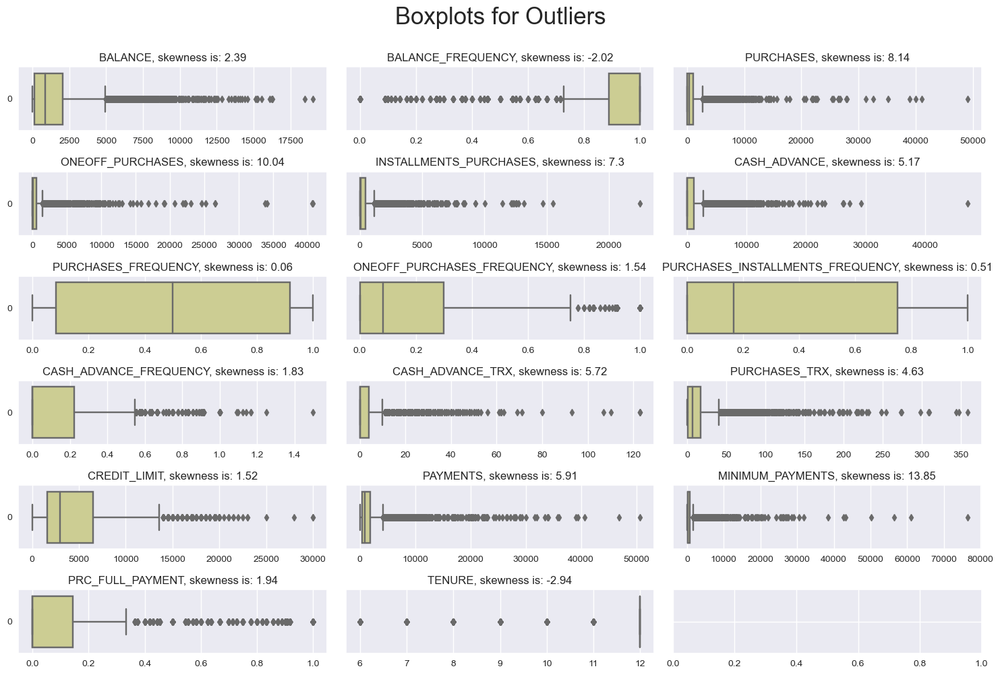

In [21]:
# Visualizing the Numerical Features by boxplots
sns.set_style('darkgrid')
def boxplots_custom(dataset, columns_list, rows, cols, suptitle):
    fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(15,10))
    fig.suptitle(suptitle, y=1, size=25)
    axs = axs.flatten()
    for i, data in enumerate(columns_list):
        sns.boxplot(data=dataset[data], orient='h', color ='#D5D68A', ax=axs[i])
        axs[i].set_title(data + ', skewness is: '+str(round(dataset[data].skew(axis = 0, skipna = True), 2)))
        
boxplots_custom(dataset=df, columns_list=df.columns, rows=6, cols=3, suptitle='Boxplots for Outliers')
plt.tight_layout()

<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">

**🪐Explanations:**
- Based on the boxplots above, we can see that there is a significant amount of skewness in the dataset.
----------
- Deleting outliers is not always recommended as it can result in loss of important information from the data. It is important to carefully evaluate the nature and distribution of the data before deciding on the appropriate data transformation technique.
----------
- On the other hand, outliers Treatment refers to the process of dealing with extreme values or outliers that may be present in a dataset. This process helps to prevent the outliers from affecting the statistical analysis and machine learning models.

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">3.4.1. Detect Outliers</p>

<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

✍️The **✅Inter Quartile Range (IQR)** is a method for detecting and handling outliers in a dataset. The **procedure** is as follows:

1. Calculate the first quartile (Q1) by finding the median of the lower half of the dataset.
2. Calculate the third quartile (Q3) by finding the median of the upper half of the dataset.
3. Calculate the interquartile range (IQR) by subtracting Q1 from Q3.
4. Calculate the lower and upper bounds for outliers:
- Lower bound = Q1 - (1.5 * IQR)
- Upper bound = Q3 + (1.5 * IQR)
5. Identify any data points that fall below the lower bound or above the upper bound as outliers.
6. Decide on how to handle the outliers, either by removing them from the dataset or by replacing them with another value (e.g. mean, median, or a value based on domain knowledge).

Overall, the IQR method is a robust way to handle outliers in a dataset as it is less sensitive to extreme values compared to other methods like z-score or modified z-score.

In [22]:
# Calculate the IQR for each column in the dataset
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Identify outliers using the IQR method
outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))

# Count the number of outliers for each variable
num_outliers = outliers.sum()

# Number of outliers for each variable
num_outliers.to_frame().T

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,695,1492,808,1013,867,1030,0,782,0,525,804,766,248,808,909,1474,1365


<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">
    
✍️The **✅z-score** method is a statistical technique used for detecting outliers in a dataset. It works by calculating the number of standard deviations a data point is from the mean of the dataset, which is known as the z-score. A data point with a z-score greater than a specified threshold, typically 3, is considered an outlier.

In [23]:
outlier_counts = {}

for col in df.columns:
    outliers = df[stats.zscore(df[col]) > 3][col]
    outlier_counts[col] = outliers.count()

outlier_df = pd.DataFrame.from_dict(outlier_counts, orient='index', columns=['Outlier Count'])
outlier_df.T

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
Outlier Count,196,0,135,122,137,182,0,0,0,199,172,185,152,159,102,0,0


In [24]:
print('z-score', outlier_df.sum())

z-score Outlier Count    1741
dtype: int64


<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

📚As a quick tutorial, I decide to deal with outliers in this dataset. 

    In this dataset, I will deal with outliers according to the method described in the description (Outliers Treatment note box) that follows.   
🚨If we decide to treat the outliers, we can perform as follows:

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">🔴3.4.2. Outliers Treatment</p>

<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

**✍️Outliers Treatment** refers to the process of dealing with extreme values or outliers that may be present in a dataset. This process helps to prevent the outliers from affecting the statistical analysis and machine learning models.

- **Flooring and Capping** involves replacing values below a certain threshold (floor) and above a certain threshold (cap) with the corresponding threshold values.

- **Trimming** involves removing the extreme values completely from the dataset.

- **Replacing** outliers with the **mean, median, mode, or other values** involves replacing the extreme values with a central tendency measure such as the mean, median or mode. However, this method should be used with caution as it can distort the distribution and may not accurately represent the true data.

- In order to **handle** these extreme values without losing the data and prevent them from having a disproportionate effect on the analysis, I will use the **✅Flooring and Capping** technique. 
    
🔍[Read more: (1)](https://medium.com/analytics-vidhya/identifying-cleaning-and-replacing-outliers-titanic-dataset-20182a062893#:~:text=in%20this%20technique%2C%20we%20replace,is%20highly%20susceptible%20to%20outliers.)
🔍[Read more: (2)](https://www.analyticsvidhya.com/blog/2021/05/detecting-and-treating-outliers-treating-the-odd-one-out/#:~:text=As%20the%20mean%20value%20is,outliers%20with%20the%20median%20value.)    

<div style="border-radius:15px;border:#B71C1B solid;background-color:#F2ECC6; padding:20px; font-size:15px">

**✍️Flooring And Capping:**
    
In this quantile-based technique, we will do the flooring (e.g 25th percentile) for the lower values and capping (e.g for the 75th percentile) for the higher values. These percentile values will be used for the quantile-based flooring and capping.

In [25]:
Outliers_Treatment = df.copy()

In [26]:
# Calculate the IQR for each column in the dataset
Q1 = Outliers_Treatment.quantile(0.25)
Q3 = Outliers_Treatment.quantile(0.75)
IQR = Q3 - Q1

# Calculate upper and lower whisker values for each column
whisker_width = 1.5
lower_whisker = Q1 - (whisker_width * IQR)
upper_whisker = Q3 + (whisker_width * IQR)

# Replace outliers with upper or lower whisker values for each column
for col in Outliers_Treatment.columns:
    Outliers_Treatment[col] = np.where(Outliers_Treatment[col] > upper_whisker[col], upper_whisker[col], np.where(Outliers_Treatment[col] < lower_whisker[col], lower_whisker[col], Outliers_Treatment[col]))
    
# Recheck outliers using the IQR method
outliers = ((Outliers_Treatment < (Q1 - 1.5 * IQR)) | (Outliers_Treatment > (Q3 + 1.5 * IQR)))
num_outliers = outliers.sum()
num_outliers.to_frame().T

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [27]:
# Print the shape of the DataFrame after Treat the Outliers
print(Outliers_Treatment.shape)

(8949, 17)


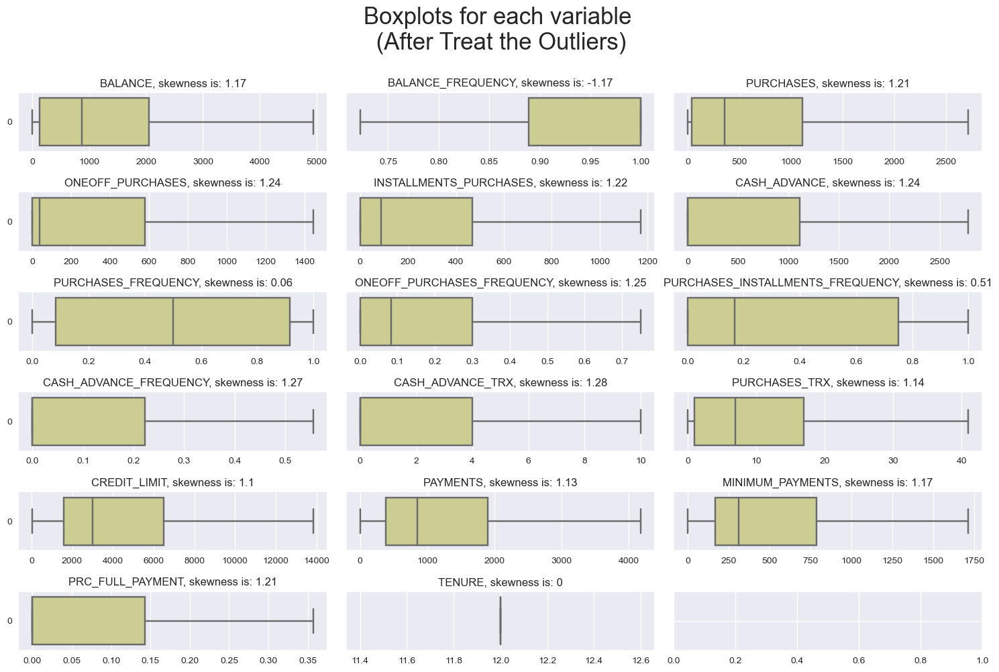

In [28]:
# Visualizing the Numerical Features by boxplots after Treat the Outliers
sns.set_style('darkgrid')
def boxplots_custom(dataset, columns_list, rows, cols, suptitle):
    fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(15,10))
    fig.suptitle(suptitle, y=1, size=25)
    axs = axs.flatten()
    for i, data in enumerate(columns_list):
        sns.boxplot(data=dataset[data], orient='h', color ='#D5D68A', ax=axs[i])
        axs[i].set_title(data + ', skewness is: '+str(round(dataset[data].skew(axis = 0, skipna = True), 2)))
        
boxplots_custom(dataset=Outliers_Treatment, columns_list=Outliers_Treatment.columns, rows=6, cols=3, suptitle='Boxplots for each variable\n (After Treat the Outliers)')
plt.tight_layout()

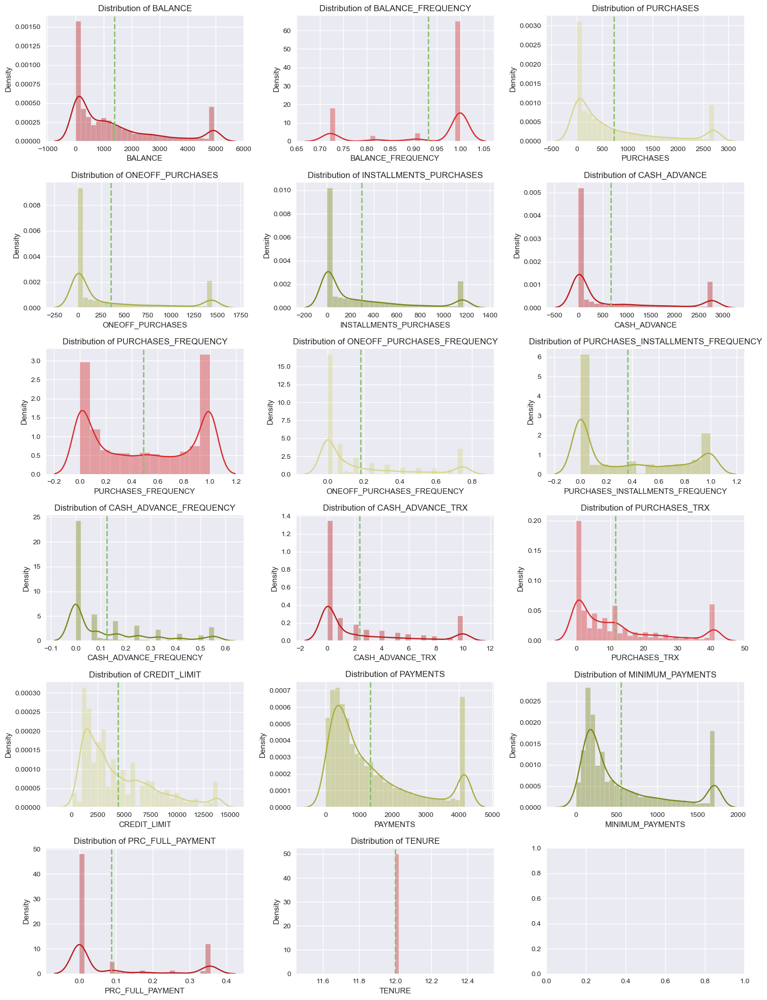

In [29]:
# Create subplots for all features
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 20))

for i, column in enumerate(Outliers_Treatment.columns):
    sns.distplot(Outliers_Treatment[column], color=colors1[i%5], ax=axes[i//3, i%3])
    axes[i//3, i%3].axvline(x=Outliers_Treatment[column].mean(), color='#88c369', linestyle='--', linewidth=2)
    axes[i//3, i%3].set_title('Distribution of '+ column)

fig.suptitle('', fontsize=16)
fig.tight_layout()

Done👍

🔴This task was done as part of a tutorial. However, in the following, I will proceed to analyze the dataset which contains outliers (the dataset before treating outliers).

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">3.5. Noises</p>

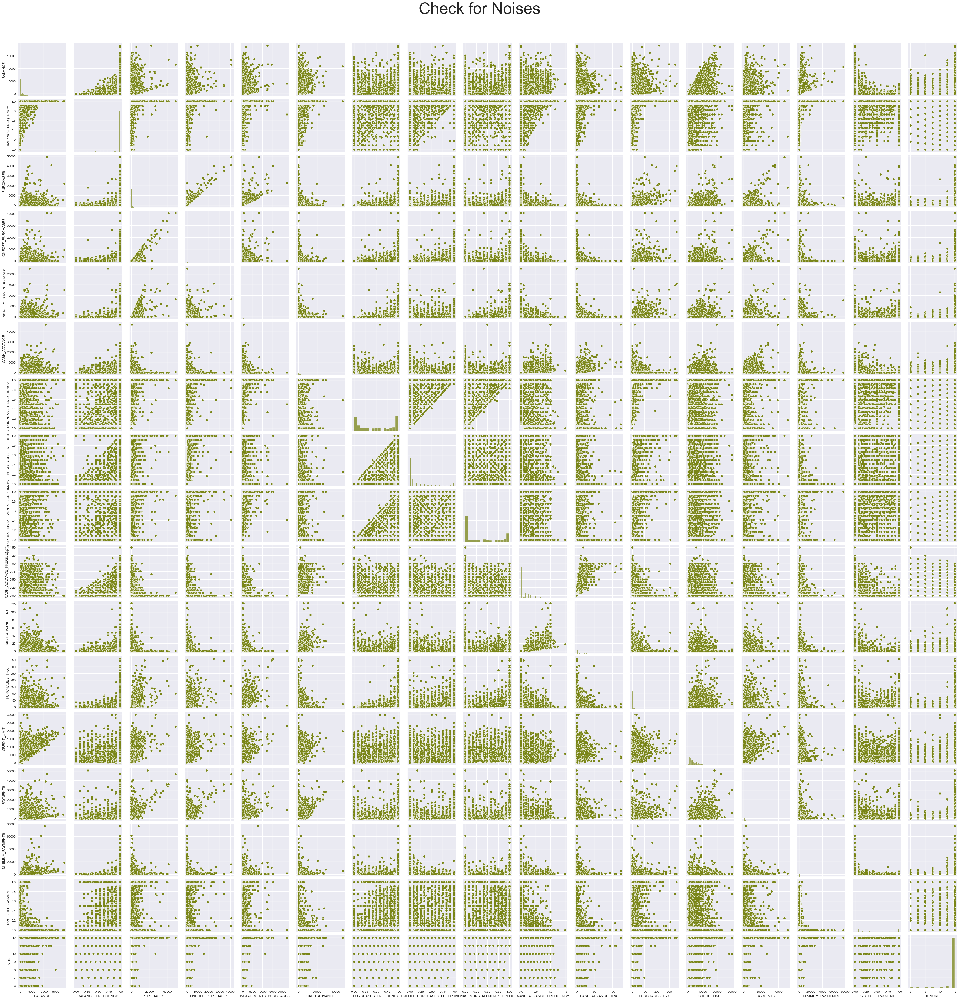

In [30]:
# pairplot for noises
colors = ['#798517']
sns.set_style('darkgrid')
sns.set_palette(colors)
sns.pairplot(df)
plt.suptitle('Check for Noises', y=1.03, fontsize=50)
plt.show()

<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">

**🪐Explanations:**
    
While there may be variables in our dataset that contain noise, it is crucial to acknowledge that they still provide valuable information that should not be excluded from our analysis. Therefore, we have made a deliberate decision to keep these variables in our dataset for a more comprehensive evaluation.

<a id="1"></a> 
# <p style="padding:15px;background-color:#798517;margin:0;color:#F2ECC6;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">4. Exploratory Data Analysis (EDA)</p> 

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">4.1. Univariate Analysis</p>

#### 🌴Distribution of the features

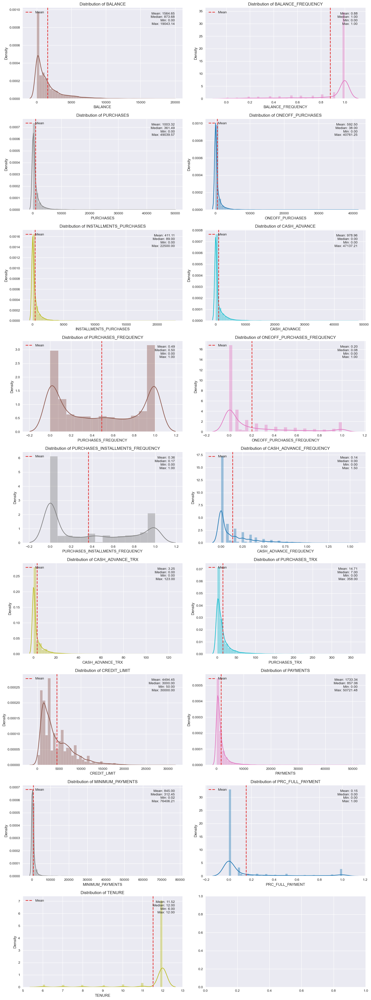

In [31]:
# Check variables distribution
fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(15, 40))

# Define colors to use for each feature
colors = ['#8C564B', '#E377C2', '#7F7F7F', '#1F77B4', '#BCBD22', '#17BECF']

# Loop through each column and plot distribution
for i, column in enumerate(df.columns):
    # Plot histogram with density curve
    sns.distplot(df[column], color=colors[i%len(colors)], ax=axes[i//2, i%2])
    
    # Add vertical lines for mean
    axes[i//2, i%2].axvline(x=df[column].mean(), color='#e33434', linestyle='--', linewidth=2, label='Mean')
    
    # Add text box with important statistics
    median = df[column].median()
    axes[i//2, i%2].text(0.95, 0.95, 
                          'Mean: {:.2f}\nMedian: {:.2f}\nMin: {:.2f}\nMax: {:.2f}'.format(
                              df[column].mean(), median, df[column].min(), df[column].max()),
                          transform=axes[i//2, i%2].transAxes,
                          fontsize=10, va='top', ha='right')
    
    # Add legend
    axes[i//2, i%2].legend(loc="upper left")
    
    # Set title of subplot
    axes[i//2, i%2].set_title('Distribution of '+ column)
    
# Add overall title and adjust spacing
fig.tight_layout()

<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">
       <strong>🪐Interpretation:</strong> 
    <br>

- The associated plot illustrates the **range** for each variable ((min, max) of each variable is shown on the related plot).  
---------------------------------------------------------------------
- The **distributions** of several variables appear to be **positively skewed**. Specifically, the variables 'BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'ONEOFF_PURCHASES_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', and 'PRC_FULL_PAYMENT' all exhibit **positive skewness** in their distributions. This means that most of the observations in these variables are clustered toward the lower end of the range, with fewer and fewer observations as you move toward the higher end.
---------------------------------------------------------------------    
- However, 'BALANCE_FREQUENCY' and 'TENURE' exhibit **negative skewness**.
---------------------------------------------------------------------    
- The variables 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES' and 'CASH_ADVANCE' demonstrate a **consistent trend** similar to that of 'Credit BALANCE' These variables are evidently correlated, as a reduced Credit Balance corresponds to lower levels of 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', and 'CASH_ADVANCE'.

#### 🌴TENURE

In [32]:
# 'TENURE' Pie Chart
colors = ["#F2ECC6", "#D5D68A", "#A6AD3C", "#798517", "#B71C1B", "#D72A2B"]

fig = px.pie(df, names='TENURE', title='Number of Months as a Customer:', color_discrete_sequence=colors)
fig.show()

In [33]:
# Describing the numerical variables
df.describe().style.background_gradient(cmap=cmap)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000
mean,1564.647593,0.877350,1003.316936,592.503572,411.113579,978.959616,0.490405,0.202480,0.364478,0.135141,3.249078,14.711476,4494.449450,1733.336511,845.003358,0.153732,11.517935
std,2081.584016,0.236798,2136.727848,1659.968851,904.378205,2097.264344,0.401360,0.298345,0.397451,0.200132,6.824987,24.858552,3638.815725,2895.168146,2332.905284,0.292511,1.337134
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.365782,0.888889,39.800000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.282850,170.875613,0.000000,12.000000
50%,873.680279,1.000000,361.490000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,857.062706,312.452292,0.000000,12.000000
75%,2054.372848,1.000000,1110.170000,577.830000,468.650000,1113.868654,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.279320,788.721609,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">4.2. Multivariate Analysis</p>

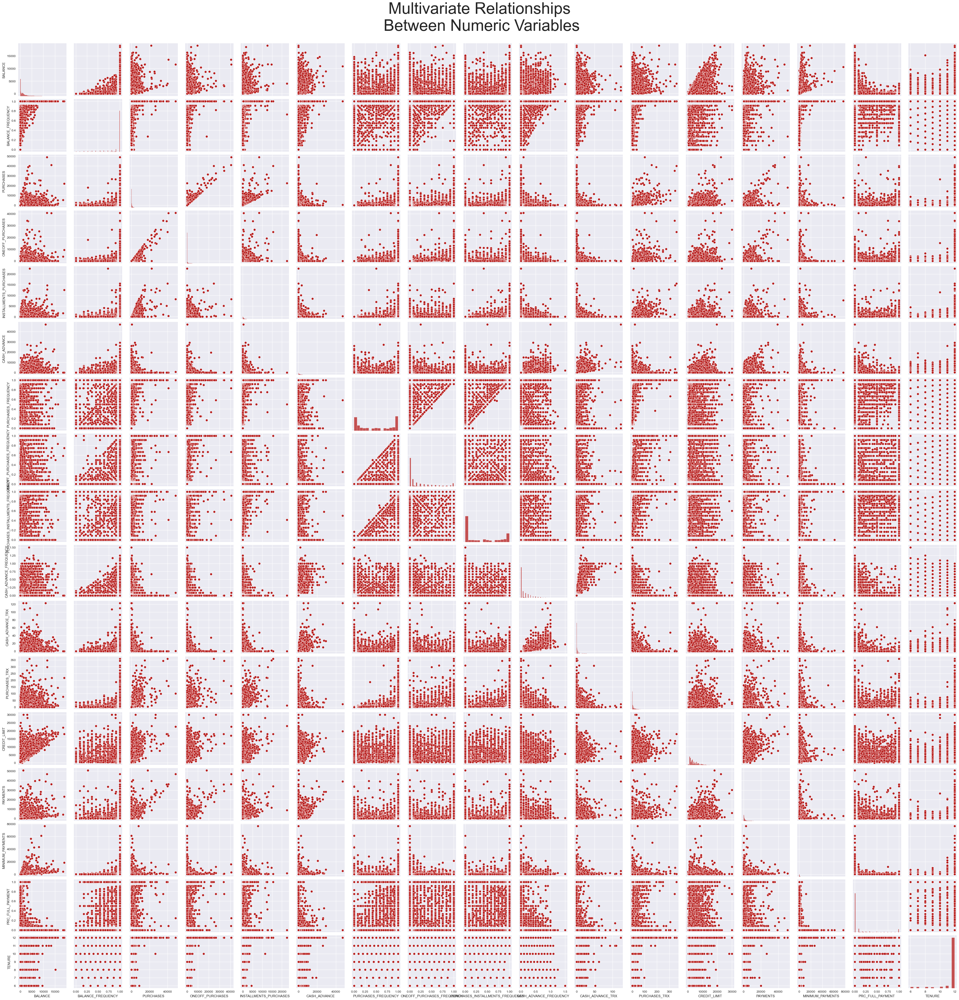

In [34]:
# Multivariate relationships between numeric variables
colors = ['#B71C1B']
sns.set_style('darkgrid')
sns.set_palette(colors)
sns.pairplot(df)
plt.suptitle('Multivariate Relationships\n Between Numeric Variables', y=1.03, fontsize=50)
plt.show()

<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">
       <strong>🪐Interpretation:</strong> 
    <br>

- There exists a linear relationship between the **credit limit** and the **balance**, as an increase in the former results in an increase in the latter.
---
- There is an inverse relationship between the number of **purchases** and **cash in advance** transactions. As the former increases, the latter decreases.
---
- A low **credit balance** corresponds to reduced **purchases**, **one-off purchases**, and **installment purchases**.
---
- A lower credit balance is associated with a lower frequency of **cash in advance** transactions.

<a id="1"></a>  
#### <p style="padding:10px;background-color:#F2ECC6;margin:0;color:#A6AD3C;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">4.2.1. Correlation Between The Features</p>

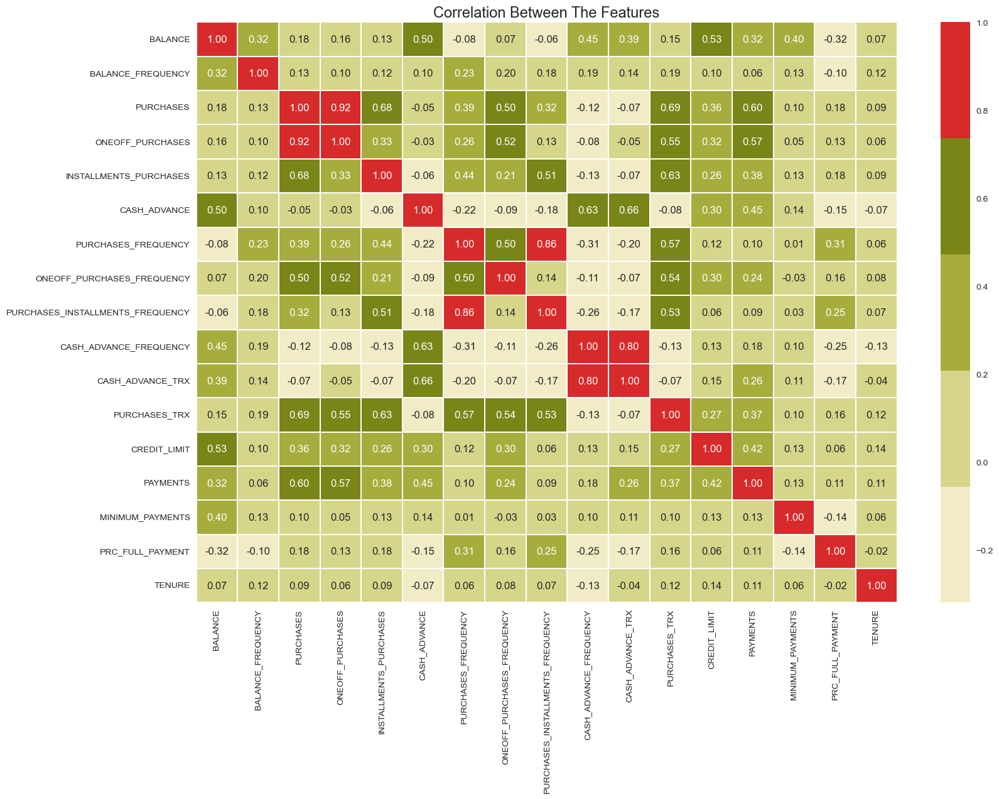

In [35]:
fig=plt.gcf()
fig.set_size_inches(18, 12)
plt.title('Correlation Between The Features', fontsize=17)
a = sns.heatmap(df.corr(), annot = True, cmap = cmap, fmt='.2f', linewidths=0.2)
a.set_xticklabels(a.get_xticklabels(), rotation=90)
a.set_yticklabels(a.get_yticklabels(), rotation=0)
plt.show()

<div style="border-radius:15px;border:#A6AD3C solid;background-color:#F2ECC6; padding:20px; font-size:15px">
       <strong>🪐Interpretation:</strong> 
    <br>
    
- The interdependence among the variables can be observed from the **💪 strong** correlation values between **One_Off_Purchases** and **Purchases**, **Purchases_Installments_Frequency** and **Purchases_Frequency**, and **Cash_Advance_Trx** and **Cash_Advance_Frequency**, which are **0.92**, **0.86**, and **0.8**, respectively.
---------------------------------------------------------------------
- In contrast, the heatmap shows a **moderate** correlation between **Purchases_Trx** and **Purchases**, **Installments_Purchases** and **Purchases**, **Cash_Advance** and **Cash_Advance_Trx**, **Cash_Advance** and **Cash_Advance_Frequency**, **Purchases_Trx** and **Installments_Purchases**, and **Purchases** and **Payments**.